In [1]:
%matplotlib inline
import scipy.io
import pandas
import cv2
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display

from xib.datasets import HicoDet

In [2]:
f = scipy.io.loadmat('../data/hico_20160224_det/anno_bbox.mat')

In [3]:
actions = []
interactions = []

for interaction in f['list_action'].squeeze():
    interactions.append({
        'action': interaction['vname'].item(),
        'object': interaction['nname'].item()
    })
    actions.append({
        'action': interaction['vname'].item(),
        'ing': interaction['vname_ing'].item(),
        'add_def': interaction['add_def'].tolist(),
        **({
            'id': interaction['synset']['id'].item().item(),
            'wid': interaction['synset']['wid'].item().item(),
            'name': interaction['synset']['name'].item().item(),
            'count': interaction['synset']['count'].item().item(),
            'synonymes': interaction['synset']['syn'].item().item(), 
            'definition': interaction['synset']['def'].item().item(),
            'examples': interaction['synset']['ex'].item().tolist()
        } if interaction['vname'].item() != 'no_interaction' else {})
    })

del interaction

actions = pd.DataFrame(actions).drop_duplicates('action')
interactions = pd.DataFrame(interactions).rename_axis(index='id')

Action types (verbs)

In [4]:
actions

,action,ing,add_def,id,wid,name,count,synonymes,definition,examples
0,board,boarding,[],1.0,v02018049,board.v.01,6,board get_on,"get on board of (trains, buses, ships, aircraf...",[]
1,direct,directing,[],5.0,v01999798,lead.v.01,131,lead take direct conduct guide,take somebody somewhere,[We lead him to our chief]
2,exit,exiting,[],1.0,v02015598,exit.v.01,72,exit go_out get_out leave,move out of or depart from,[leave the room]
3,fly,flying,[],3.0,v01941093,fly.v.03,6,fly aviate pilot,operate an airplane,[The pilot flew to Cuba]
4,inspect,inspecting,[],1.0,v02165543,inspect.v.01,13,inspect,look over carefully,[Please inspect your father's will carefully]
...,...,...,...,...,...,...,...,...,...,...
551,flush,flushing,[],5.0,v00455529,flush.v.05,0,flush scour purge,"rinse, clean, or empty with a liquid",[flush the wound with antibiotics]
558,brush_with,brushing_with,[],1.0,v01243809,brush.v.01,11,brush,"rub with a brush, or as if with a brush",[Johnson brushed the hairs from his jacket]
562,install,installing,[],1.0,v01569566,install.v.01,37,install instal put_in set_up,set up for use,[install the washer and dryer]
578,lose,losing,[],1.0,v02287789,lose.v.01,123,lose,"fail to keep or to maintain; cease to have, ei...",[She lost her purse when she left it unattende...


Interaction types (verb + object)

In [5]:
interactions

,action,object
id,,
0,board,airplane
1,direct,airplane
2,exit,airplane
3,fly,airplane
4,inspect,airplane
...,...,...
595,feed,zebra
596,hold,zebra
597,pet,zebra


Objects

In [6]:
interactions.object.drop_duplicates().to_frame()

,object
id,
0,airplane
10,bicycle
24,bird
31,boat
46,bottle
...,...
567,truck
576,umbrella
584,vase


Image shapes

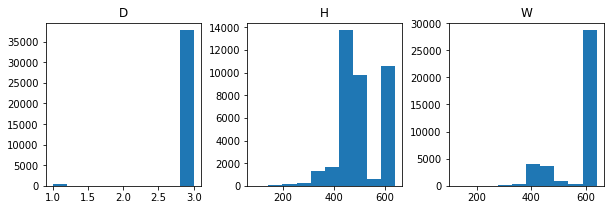

In [7]:
img_info = []
for img in f['bbox_train'].squeeze():
    img_info.append({
        'filename': img['filename'].item(),
        'D': img['size']['depth'].item().item(),
        'H': img['size']['height'].item().item(),
        'W': img['size']['width'].item().item()
    })
img_info = pd.DataFrame(img_info)
img_info.drop(columns='filename').hist(layout=(1,3), figsize=(10, 3), grid=False);

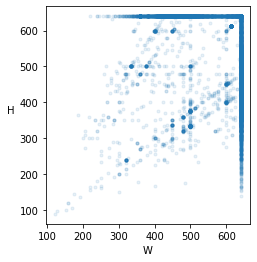

In [8]:
fig, ax = plt.subplots(1, 1)
ax.scatter(img_info.W, img_info.H, marker='.', alpha=.1)
ax.set_xlabel('W')
ax.set_ylabel('H   ', rotation=0)
ax.set_aspect('equal');

In [9]:
samples = []

for img in f['bbox_train'].squeeze():
    filename = img['filename'].item()
    
    # All interaction types
    for interaction in img['hoi'].squeeze(0):
        interaction_id = interaction['id'].item() - 1
        
        # Invisible interaction, no humans or objects visible
        if interaction['invis'].item() == 1:
            samples.append({
                'filename': filename,
                'interaction_id': interaction_id,
                'instance_id': -1,
                'bb_human': None,
                'bb_object': None,
                'visible': False,
            })
            continue
        
        # All humans for this interaction
        humans = [
            (human['x1'].item(), human['y1'].item(), human['x2'].item(), human['y2'].item())
            for human in interaction['bboxhuman'].squeeze(0)
        ]
            
        # All objects for this interaction
        objects = [
            (object['x1'].item(), object['y1'].item(), object['x2'].item(), object['y2'].item())
            for object in interaction['bboxobject'].squeeze(0)
        ]
        
        # All instances of this interaction type
        action_instances = interaction['connection'].shape[0]
        for instance_id, instance in enumerate(interaction['connection']):          
            samples.append({
                'filename': filename,
                'interaction_id': interaction_id,
                'instance_id': instance_id,
                'bb_human': humans[instance[0] - 1],
                'bb_object': objects[instance[1] - 1],
                'visible': True,
            })
samples = pd.DataFrame(samples)

In [10]:
df = pd.merge(
    samples,
    interactions,
    left_on='interaction_id',
    right_index=True
)
df.head()

,filename,interaction_id,instance_id,bb_human,bb_object,visible,action,object
0,HICO_train2015_00000001.jpg,152,0,"(208, 33, 427, 300)","(59, 98, 572, 405)",True,race,motorcycle
148,HICO_train2015_00000062.jpg,152,0,"(378, 61, 426, 110)","(388, 102, 426, 140)",True,race,motorcycle
149,HICO_train2015_00000062.jpg,152,1,"(323, 59, 365, 116)","(325, 110, 376, 166)",True,race,motorcycle
150,HICO_train2015_00000062.jpg,152,2,"(156, 81, 215, 169)","(122, 134, 242, 215)",True,race,motorcycle
151,HICO_train2015_00000062.jpg,152,3,"(412, 108, 507, 195)","(404, 160, 530, 233)",True,race,motorcycle


Most common actions in the training set

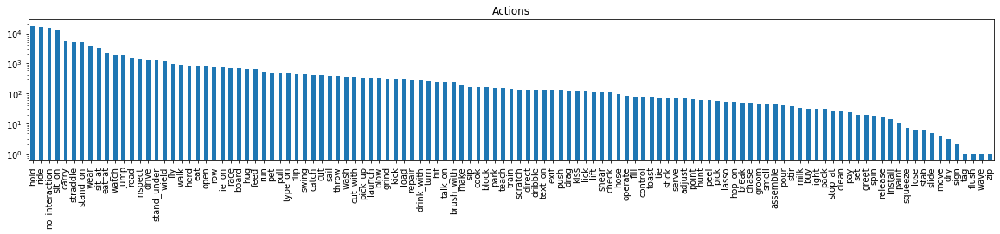

In [11]:
df.action.value_counts().plot.bar(logy=True, figsize=(20, 3)).set_title('Actions');

Most common objects in the training set

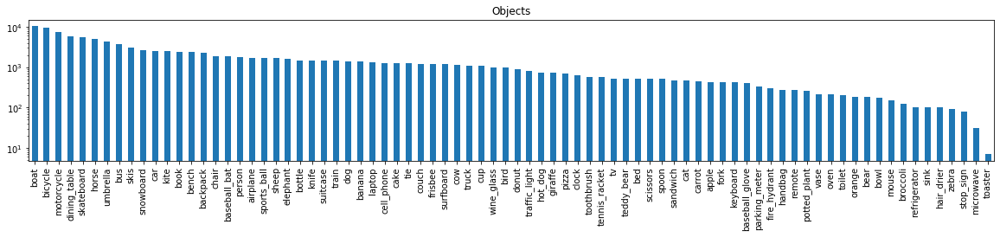

In [12]:
df.object.value_counts().plot.bar(logy=True, figsize=(20, 3)).set_title('Objects');

Most common interactions

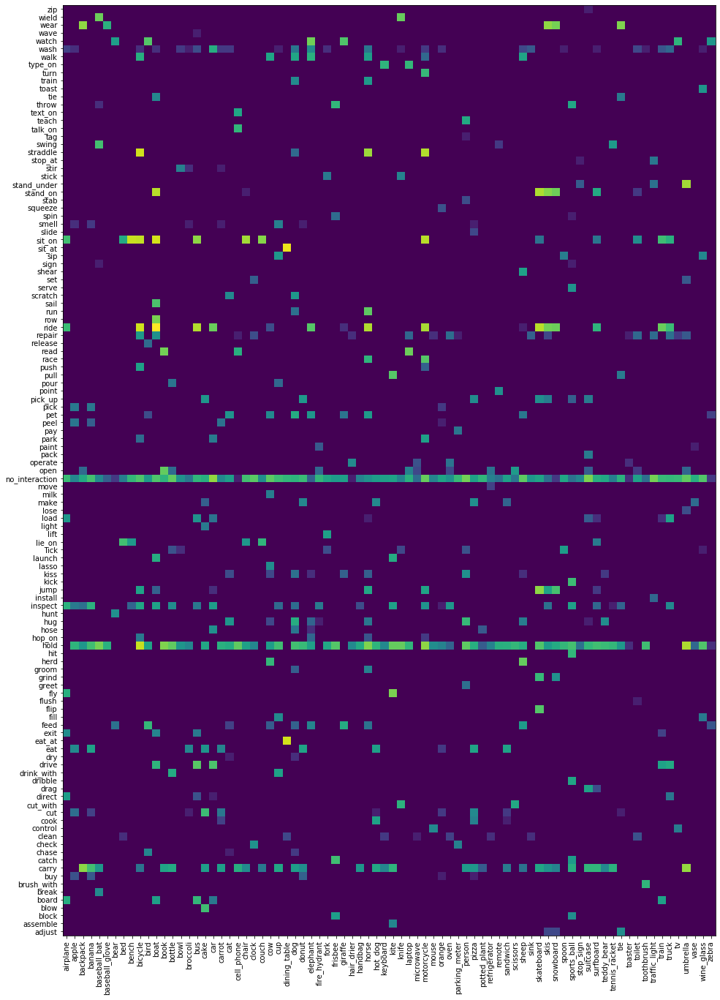

In [13]:
df_freq = df.groupby(['action', 'object']) \
    .interaction_id \
    .count() \
    .unstack('object', fill_value=0)

fig, ax = plt.subplots(1, 1, figsize=(df_freq.shape[1] / 5, df_freq.shape[0] / 5))
ax.pcolormesh(np.arange(df_freq.shape[1] + 1), np.arange(df_freq.shape[0] + 1), np.log(df_freq.values+1))
ax.set_xticks(np.arange(df_freq.shape[1] + 1) + .5)
ax.set_xticklabels(df_freq.columns, rotation=90);
ax.set_yticks(np.arange(df_freq.shape[0] + 1) + .5)
ax.set_yticklabels(df_freq.index, rotation=0)
ax.set_xlim(xmax=ax.get_xlim()[1] - .5)
ax.set_ylim(ymax=ax.get_ylim()[1] - .5);

Some problems with the images / annotations

In [14]:
def show_all(filename):
    img = cv2.cvtColor(
            cv2.imread(f'../data/hico_20160224_det/images/train2015/{filename}'), 
            cv2.COLOR_BGR2RGB
        )
    
    df_img = df.query(f'filename == "{filename}"')
    ncols = min(len(df_img) + 1, 3)
    nrows = int(np.ceil(len(df_img) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 8 * nrows), squeeze=False)
    
    ax = axes.flat[0]
    ax.imshow(img)
    ax.set_title(f'{filename} {img.shape[1]} x {img.shape[0]}')
    
    for interaction, ax in zip(df_img.itertuples(), axes.flat[1:]):
        ax.imshow(img)
        ax.set_title(f'{interaction.action} {interaction.object} #{interaction.instance_id}')
        if not interaction.visible:
            continue
        ax.add_artist(plt.Rectangle(
            [interaction.bb_human[0], interaction.bb_human[1]],
            width=interaction.bb_human[2] - interaction.bb_human[0], 
            height=interaction.bb_human[3] - interaction.bb_human[1],
            fill=False,
            linewidth=5,
            color='blue'
        ))
        ax.add_artist(plt.Rectangle(
            [interaction.bb_object[0], interaction.bb_object[1]],
            width=interaction.bb_object[2] - interaction.bb_object[0], 
            height=interaction.bb_object[3] - interaction.bb_object[1],
            fill=False,
            linewidth=5,
            color='red'
        ))
    
    for ax in axes.flat:
        ax.set_axis_off()

Same objects but different actions result in different bounding boxes

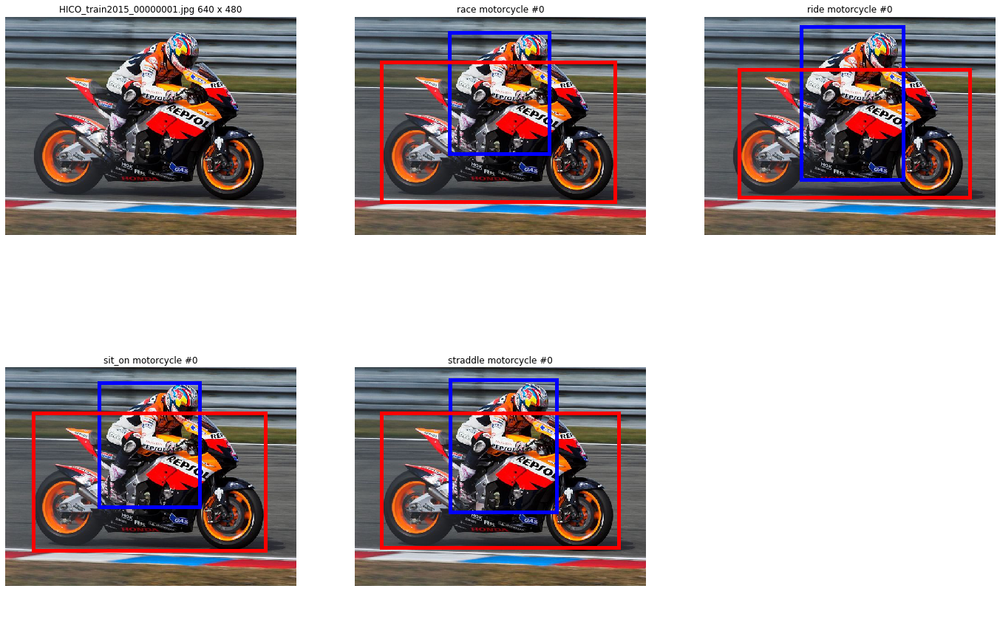

In [15]:
show_all('HICO_train2015_00000001.jpg')

Multiple instances of the same action reuse the bounding boxes instead

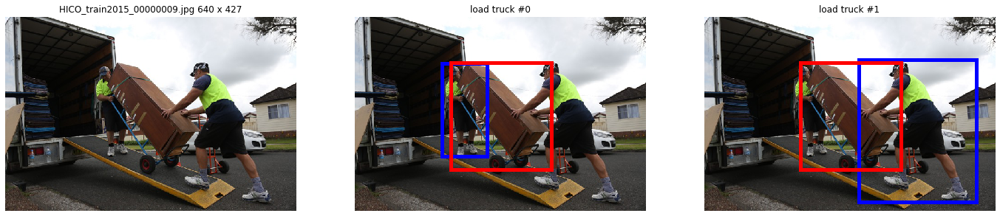

In [16]:
show_all('HICO_train2015_00000009.jpg')

No interaction instances

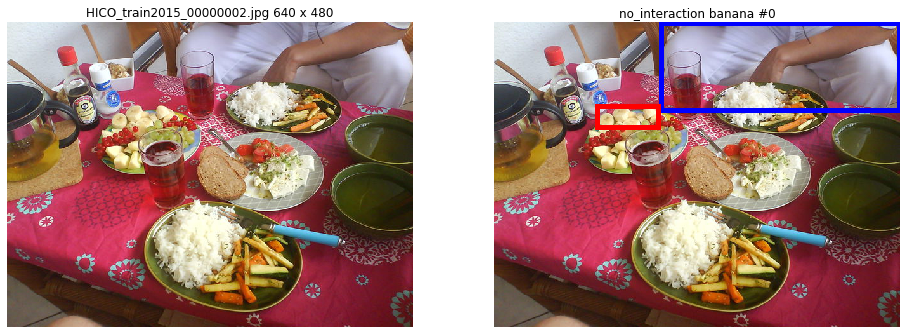

In [17]:
show_all('HICO_train2015_00000002.jpg')

No interaction instances

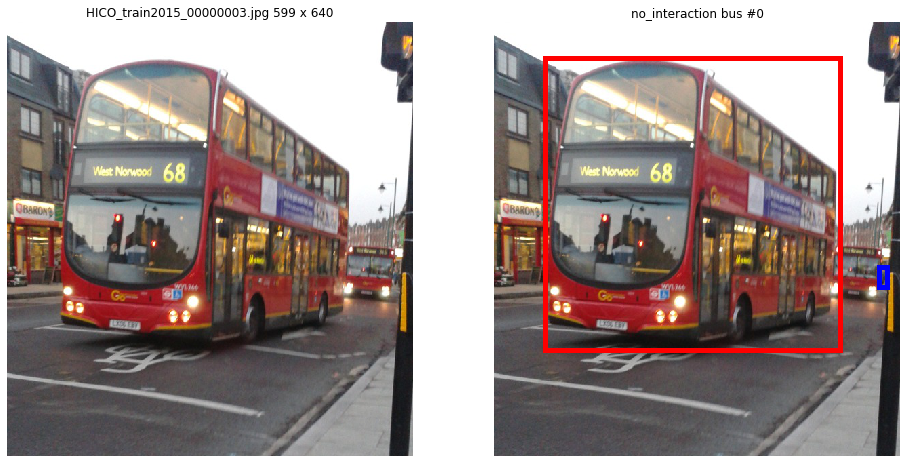

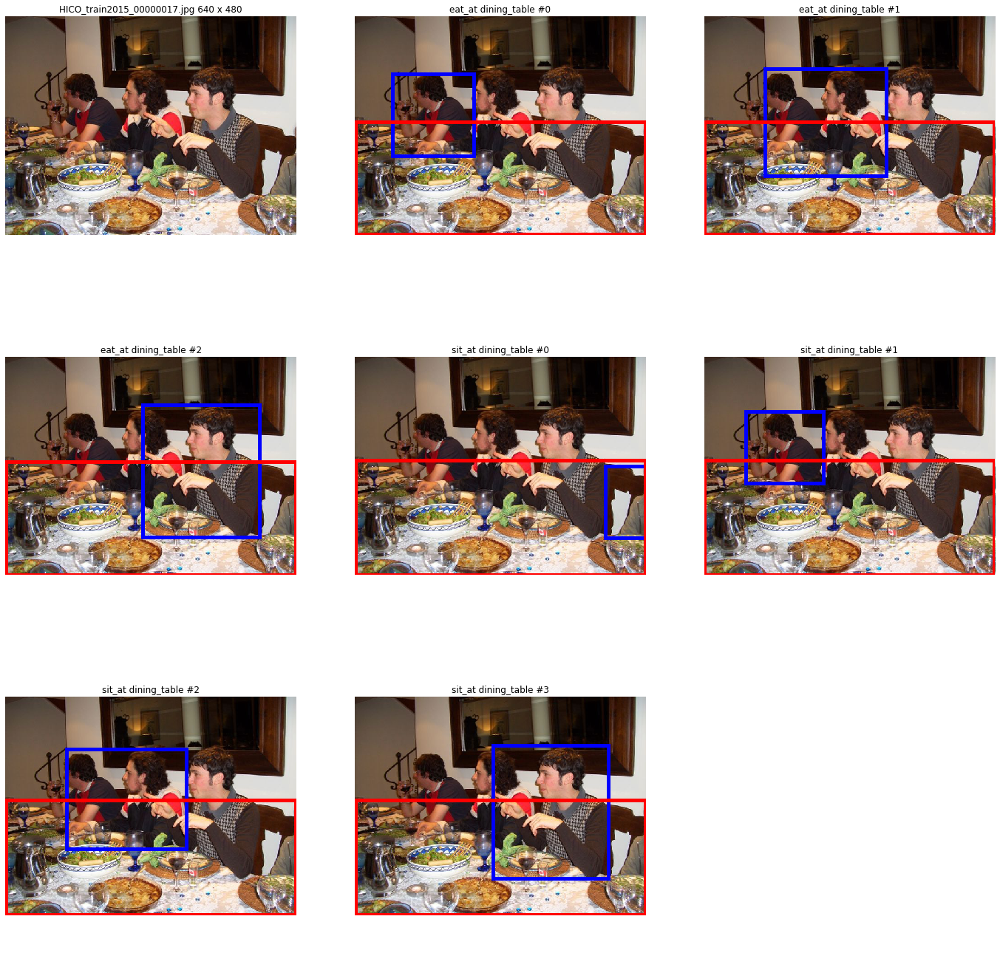

In [18]:
show_all('HICO_train2015_00000003.jpg')
show_all('HICO_train2015_00000017.jpg')

Debatable human boxes

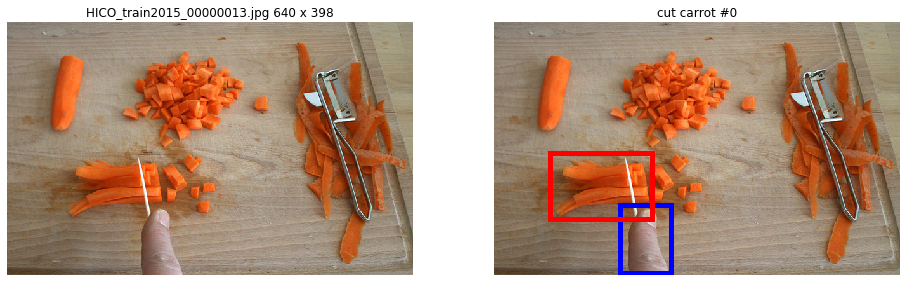

In [19]:
show_all('HICO_train2015_00000013.jpg')

Debatable object boxes

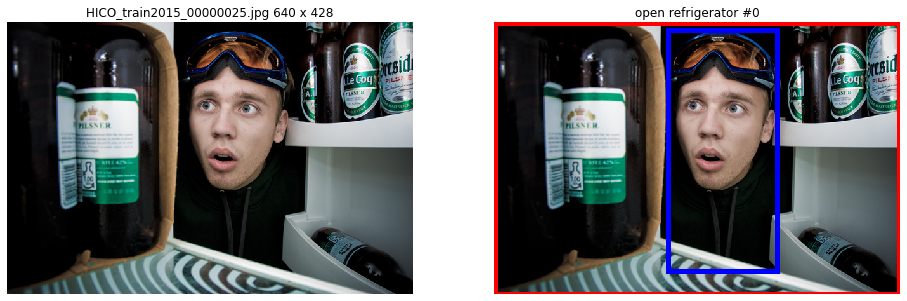

In [20]:
show_all('HICO_train2015_00000025.jpg')

Invisible interactions

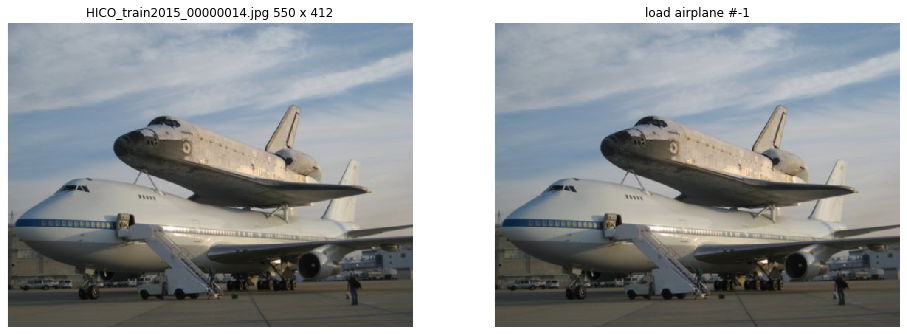

In [21]:
show_all('HICO_train2015_00000014.jpg')

Crowds

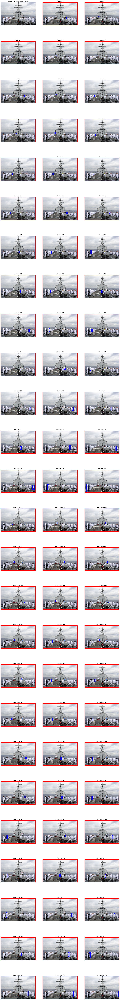

In [22]:
show_all('HICO_train2015_00000086.jpg')

Smallest image by area

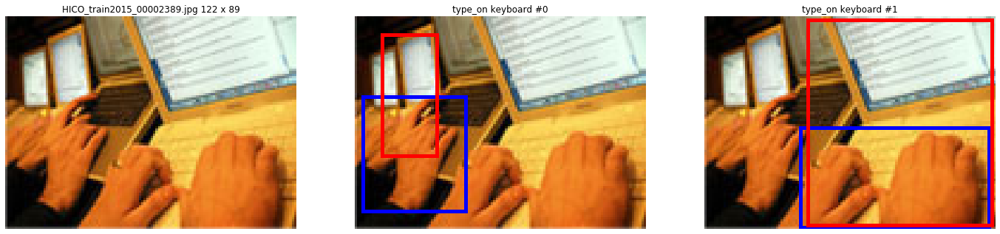

In [23]:
show_all(img_info.iloc[(img_info.H * img_info.W).idxmin()].filename)

Most vertically elongated image

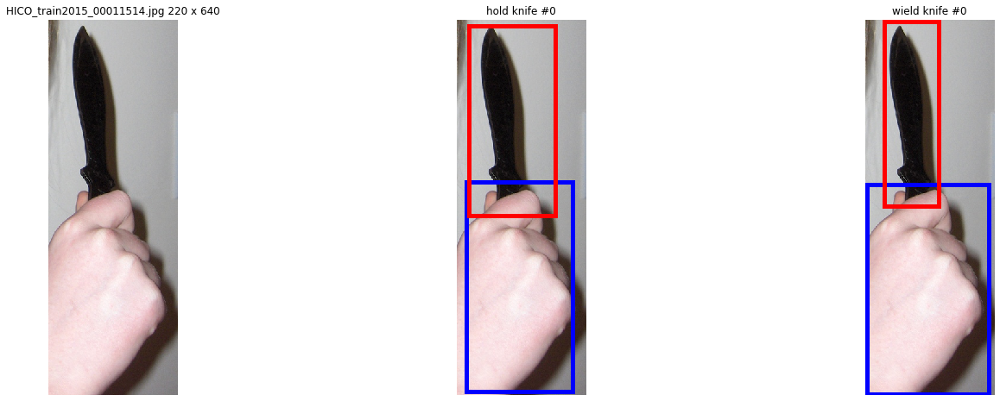

In [24]:
show_all(img_info.iloc[(img_info.H / img_info.W).idxmax()].filename)

Most horizontally elongated image

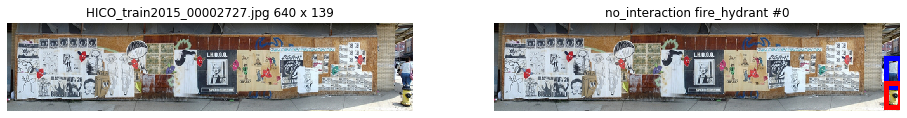

In [25]:
show_all(img_info.iloc[(img_info.H / img_info.W).idxmin()].filename)

Just more images

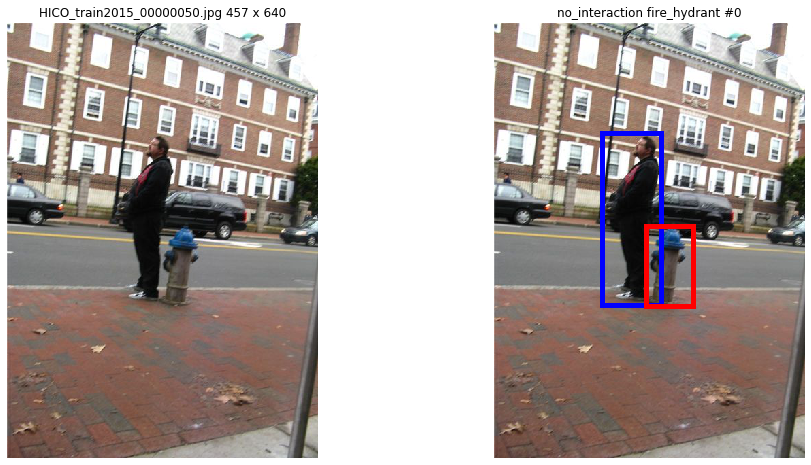

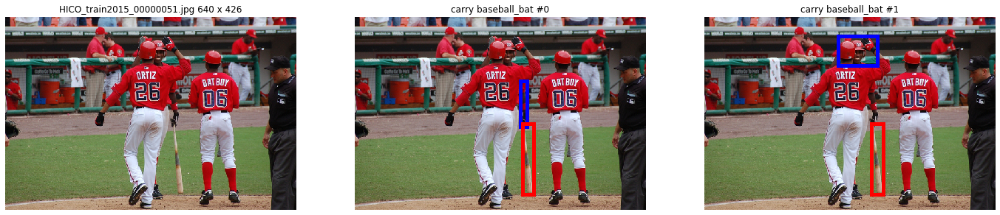

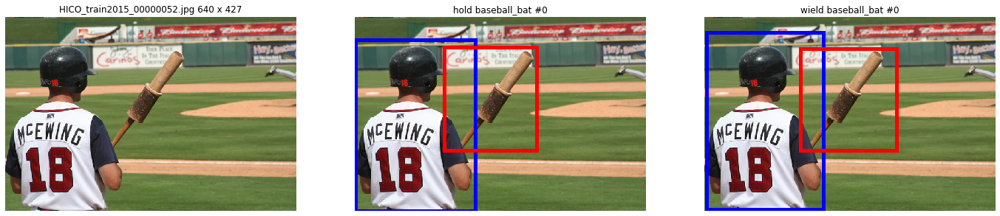

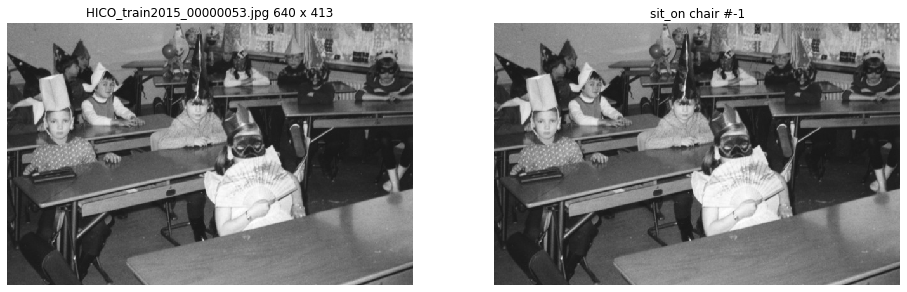

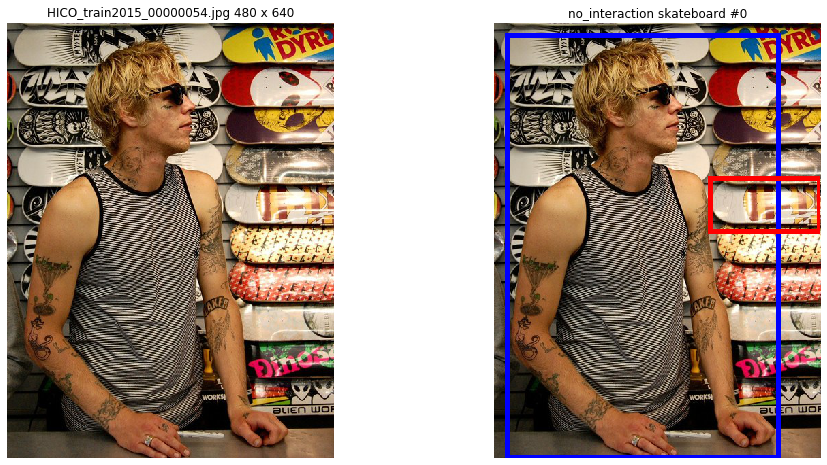

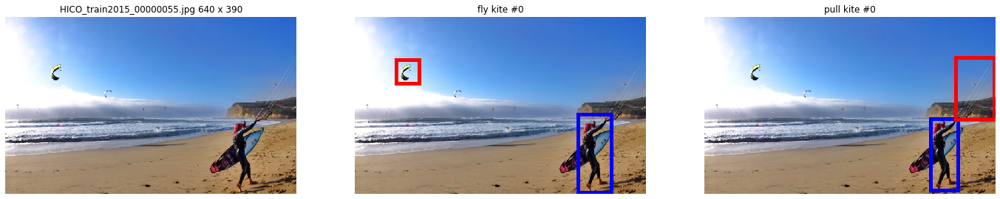

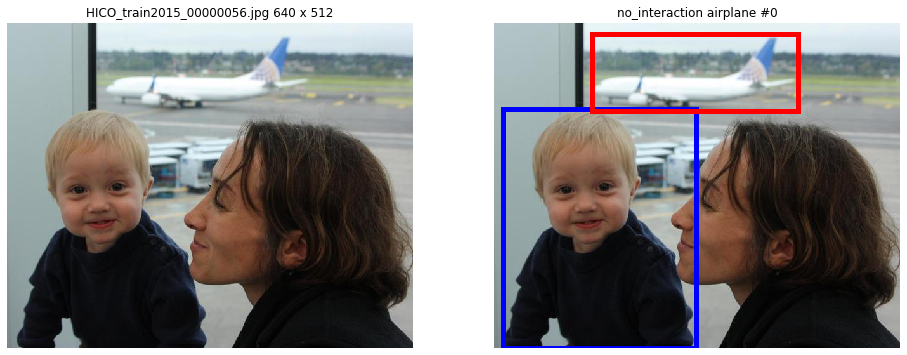

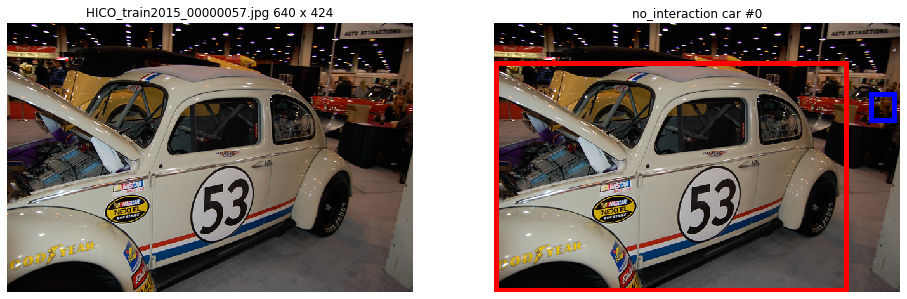

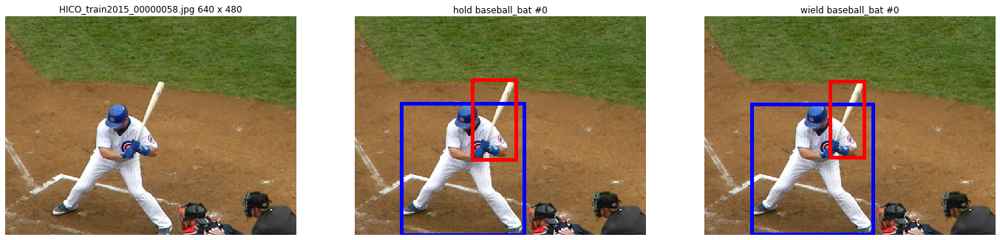

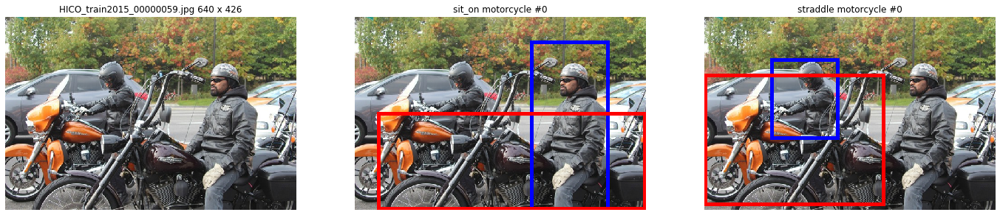

In [26]:
for i in range(50, 60):
    show_all(f'HICO_train2015_000000{i}.jpg')